# Exploratory Data Analysis on Various Statistics of Living Factors in the United States. Use Data Cleaning, Feature Engineering, Visualization and Machine Learning to Analyze and Draw Insights from Data.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import re
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from IPython.display import Image  
from sklearn.tree import export_graphviz
import graphviz
import pydotplus
from io import StringIO
from IPython.display import Image

# Gather Data for Analysis

## Crime Data

In [2]:

crime_data = [
    ('Alabama', 5074296, 21.48, 4.09),
    ('Alaska', 733583, 25.48, 7.59),
    ('Arizona', 7359197, 24.89, 4.31),
    ('Arkansas',3045637, 30.97, 6.45),
    ('California', 39029342, 28.43, 4.99),
    ('Colorado', 5839926, 36.40, 4.92),
    ('Connecticut',	3626205, 16.44,	1.50),
    ('Delaware', 1018396, 23.48, 3.84),
    ('Florida',	22244823, 18.25, 2.59),
    ('Georgia',	10912876, 20.58, 3.67),
    ('Hawaii',	1440196, 26.94,	2.60),
    ('Idaho', 1939033, 11.68, 2.41),
    ('Illinois', 12582032, 19.70, 2.87),
    ('Indiana',	6833037, 18.50, 3.06),
    ('Iowa',	3200517, 16.18, 2.87),
    ('Kansas',	2937150, 24.07, 4.15),
    ('Kentucky', 4512310, 16.63, 2.14),
    ('Louisiana',	4590241, 33.77, 6.29),
    ('Maine', 1385340, 13.17, 1.03),
    ('Maryland', 6164660, 20.34, 3.98),
    ('Massachusetts', 6981974, 13.92, 3.22),
    ('Michigan', 10034113, 19.98, 4.61),
    ('Minnesota', 5717184, 22.47, 2.81),
    ('Mississippi',	2940057, 19.92, 2.45),
    ('Missouri', 6177957, 28.28, 4.88),
    ('Montana',	1122867, 23.37, 4.18),
    ('Nebraska', 1967923, 21.72, 2.83),
    ('Nevada',	3177772, 28.34, 4.54),
    ('New Hampshire', 1395231, 11.37, 1.26),
    ('New Jersey', 9261699, 16.20, 2.03),
    ('New Mexico', 2113344, 37.65, 7.80),
    ('New York', 19677151, 21.51, 4.29),
    ('North Carolina', 10698973, 24.69, 4.05),
    ('North Dakota', 779261, 22.74, 2.80),
    ('Ohio', 11756058, 20.76, 2.94),
    ('Oklahoma', 4019800, 27.52, 4.20),
    ('Oregon',	4240137, 32.78, 3.42),
    ('Pennsylvania', 12972008, 17.62, 2.80),
    ('Rhode Island', 1093734, 14.58, 1.72),
    ('South Carolina',	5282634, 28.00, 4.91),
    ('South Dakota', 909824, 21.14, 3.77),
    ('Tennessee', 7051339, 29.24, 6.22),
    ('Texas', 30029572, 27.32, 4.32),
    ('Utah', 3380800, 21.37, 2.42),
    ('Vermont',	647064, 18.93, 2.22),
    ('Virginia', 8683619, 19.30, 2.34),
    ('Washington',	7785786, 37.32, 3.76),
    ('West Virginia', 1775156, 15.08, 2.78),
    ('Wisconsin', 5892539, 16.82, 2.97),
    ('Wyoming',	581381, 18.39, 2.02),
    ('District of Columbia', 671803, 42.29, 7.45),
]

crime_columns = ['state', 'state_population', 'crime_rate', 'violent_crime_rate']
crime_table = pd.DataFrame(crime_data, columns=crime_columns)

## Environment Data

In [3]:

environment_data = [
    ('Alabama', 36.45),
    ('Alaska', 39.04),
    ('Arizona', 53.22),
    ('Arkansas', 46.62),
    ('California', 75.75),
    ('Colorado', 67.61),
    ('Connecticut',	69.83),
    ('Delaware', 69.58),
    ('District of Columbia', None),
    ('Florida',	56.65),
    ('Georgia',	56.47),
    ('Hawaii',	70.36),
    ('Idaho', 57.15),
    ('Illinois', 64.78),
    ('Indiana',	55.03),
    ('Iowa',	57.45),
    ('Kansas',	53.33),
    ('Kentucky', 38.37),
    ('Louisiana', 28.62),
    ('Maine', 70.10),
    ('Maryland', 74.35),
    ('Massachusetts', 69.69),
    ('Michigan', 66.32),
    ('Minnesota', 70.51),
    ('Mississippi',	37.22),
    ('Missouri', 54.44),
    ('Montana',	58.56),
    ('Nebraska', 52.52),
    ('Nevada', 64.50),
    ('New Hampshire', 63.63),
    ('New Jersey', 60.42),
    ('New Mexico', 46.59),
    ('New York', 74.67),
    ('North Carolina', 60.31),
    ('North Dakota', 42.92),
    ('Ohio', 58.05),
    ('Oklahoma', 47.60),
    ('Oregon',	68.44),
    ('Pennsylvania', 60.43),
    ('Rhode Island', 68.69),
    ('South Carolina',	59.34),
    ('South Dakota', 64.74),
    ('Tennessee', 49.50),
    ('Texas', 50.40),
    ('Utah', 61.49),
    ('Vermont',	74.75),
    ('Virginia', 62.62),
    ('Washington',	72.90),
    ('West Virginia', 22.38),
    ('Wisconsin', 62.87),
    ('Wyoming',	42.45),
]

environment_columns = ['state', 'environment_score']
environment_table = pd.DataFrame(environment_data, columns=environment_columns)

## Life Expectancy Data

In [4]:
life_expectancy_data = [
    ('Alabama', 73.2, 70.1, 76.4),
    ('Alaska', 76.6, 74.3, 79.2),
    ('Arizona', 76.3, 73.4, 79.5),
    ('Arkansas', 73.8, 71.1, 76.6),
    ('California', 79.0, 76.2, 82.0),
    ('Connecticut', 78.4, 75.6, 81.3),
    ('Delaware', 76.7, 73.9, 79.5),
    ('District of Columbia', 75.3, 71.7, 78.7),
    ('Florida', 77.5, 74.6, 80.5),
    ('Georgia', 75.6, 72.8, 78.3),
    ('Hawaii', 80.7, 77.6, 83.8),
    ('Idaho', 78.4, 76.1, 80.8),
    ('Illinois', 76.8, 73.8, 79.8),
    ('Indiana', 75.0, 72.3, 77.9),
    ('Iowa', 77.5, 74.9, 80.1),
    ('Kansas', 76.4, 73.8, 79.2),
    ('Kentucky', 73.5, 70.6, 76.5),
    ('Louisiana', 73.1, 69.9, 76.4),
    ('Maine', 77.8, 74.9, 80.7),
    ('Maryland', 76.8, 73.8, 79.7),
    ('Massachusetts', 79.0, 76.4, 81.5),
    ('Michigan', 76.0, 73.4, 78.8),
    ('Minnesota', 79.1, 76.8, 81.4),
    ('Mississippi', 71.9, 68.6, 75.2),
    ('Missouri', 75.1, 72.1, 78.1),
    ('Montana', 76.8, 74.2, 79.6),
    ('Nebraska', 77.7, 75.2, 80.3),
    ('Nevada', 76.3, 73.5, 79.2),
    ('New Hampshire', 79.0, 76.5, 81.5),
    ('New Jersey', 77.5, 74.6, 80.5),
    ('New Mexico', 74.5, 71.3, 77.8),
    ('New York', 77.7, 74.8, 80.7),
    ('North Carolina', 76.1, 73.3, 79.0),
    ('North Dakota', 76.9, 74.2, 80.0),
    ('Ohio', 75.3, 72.5, 78.1),
    ('Oklahoma', 74.1, 71.5, 76.9),
    ('Oregon', 78.8, 76.3, 81.3),
    ('Pennsylvania', 76.8, 74.0, 79.6),
    ('Rhode Island', 78.2, 75.5, 80.9),
    ('South Carolina',	74.8, 71.7, 78.0),
    ('South Dakota', 76.7, 74.2, 79.4),
    ('Tennessee', 73.8, 70.7, 77.0),
    ('Texas', 76.5, 73.7, 79.3),
    ('Utah', 78.6, 76.7, 80.6),
    ('Vermont',	78.8, 76.1, 81.4),
    ('Virginia', 77.6, 75.1, 80.1),
    ('Washington', 79.2, 76.9, 81.6),
    ('West Virginia', 72.8, 69.8, 76.1),
    ('Wisconsin', 77.7, 75.2, 80.3),
    ('Wyoming',	76.3, 74.0, 78.9),
]

life_expectancy_columns = ['state', 'life_expectancy', 'male_life_expectancy', 'female_life_expectancy']
life_expectancy_table = pd.DataFrame(life_expectancy_data, columns=life_expectancy_columns)

## Happiness Data

In [5]:

happiness_data = [
    ('Alabama', 40.82),
    ('Alaska', 42.20),
    ('Arizona', 53.48),
    ('Arkansas', 39.72),
    ('California', 60.53),
    ('Colorado', 51.51),
    ('Connecticut',	60.68),
    ('Delaware', 58.68),
    ('District of Columbia', 55.09),
    ('Florida',	59.31),
    ('Georgia',	54.10),
    ('Hawaii', 66.42),
    ('Idaho', 59.31),
    ('Illinois', 56.23),
    ('Indiana',	46.48),
    ('Iowa', 55.03),
    ('Kansas',	54.46),
    ('Kentucky', 40.58),
    ('Louisiana', 35.86),
    ('Maine', 51.99),
    ('Maryland', 64.62),
    ('Massachusetts', 58.43),
    ('Michigan', 50.20),
    ('Minnesota', 62.82),
    ('Mississippi',	41.42),
    ('Missouri', 48.64),
    ('Montana',	49.11),
    ('Nebraska', 58.92),
    ('Nevada', 50.71),
    ('New Hampshire', 57.29),
    ('New Jersey', 61.98),
    ('New Mexico', 43.49),
    ('New York', 56.71),
    ('North Carolina', 53.55),
    ('North Dakota', 58.02),
    ('Ohio', 47.77),
    ('Oklahoma', 44.09),
    ('Oregon', 47.67),
    ('Pennsylvania', 53.96),
    ('Rhode Island', 52.40),
    ('South Carolina', 55.27),
    ('South Dakota', 55.93),
    ('Tennessee', 38.30),
    ('Texas', 47.66),
    ('Utah', 69.79),
    ('Vermont',	52.78),
    ('Virginia', 57.69),
    ('Washington', 54.87),
    ('West Virginia', 35.08),
    ('Wisconsin', 55.74),
    ('Wyoming',	48.06),
]

happiness_columns = ['state', 'happiness_score']
happiness_table = pd.DataFrame(happiness_data, columns=happiness_columns)

# State Abbreviations

In [6]:
state_abb = [
('Alabama', 'AL'),
('Alaska', 'AK'),
('Arizona', 'AZ'),
('Arkansas', 'AR'),
('California', 'CA'),
('Colorado', 'CO'),
('Connecticut', 'CT'),
('Delaware', 'DE'),
('Florida', 'FL'),
('Georgia', 'GA'),
('Hawaii', 'HI'),
('Idaho', 'ID'),
('Illinois', 'IL'),
('Indiana', 'IN'),
('Iowa', 'IA'),
('Kansas', 'KS'),
('Kentucky', 'KY'),
('Louisiana', 'LA'),
('Maine', 'ME'),
('Maryland', 'MD'),
('Massachusetts', 'MA'),
('Michigan', 'MI'),
('Minnesota', 'MN'),
('Mississippi', 'MS'),
('Missouri', 'MO'),
('Montana', 'MT'),
('Nebraska', 'NE'),
('Nevada', 'NV'),
('New Hampshire', 'NH'),
('New Jersey', 'NJ'),
('New Mexico', 'NM'),
('New York', 'NY'),
('North Carolina', 'NC'),
('North Dakota', 'ND'),
('Ohio', 'OH'),
('Oklahoma', 'OK'),
('Oregon', 'OR'),
('Pennsylvania', 'PA'),
('Rhode Island', 'RI'),
('South Carolina', 'SC'),
('South Dakota', 'SD'),
('Tennessee', 'TN'),
('Texas', 'TX'),
('Utah', 'UT'),
('Vermont', 'VT'),
('Virginia', 'VA'),
('Washington', 'WA'),
('West Virginia', 'WV'),
('Wisconsin', 'WI'),
('Wyoming', 'WY'),
('District of Columbia', 'DC'),
]

state_abb_list = [{'state': state, 'state_abb': abb} for state, abb in state_abb] # dictionary used for merging later
state_abb_dict = dict(state_abb)

# Load Dataframe

In [7]:
cost_of_living_us = pd.read_csv('cost_of_living_us.csv')

## Merge Data onto cost_of_living_us

In [8]:
life_expectancy_table['state_abbreviation'] = life_expectancy_table['state'].map(state_abb_dict)
life_expectancy_temp = life_expectancy_table[['state_abbreviation', 'life_expectancy', 'male_life_expectancy', 'female_life_expectancy']]

cost_of_living_us = cost_of_living_us.merge(life_expectancy_temp, left_on='state', right_on='state_abbreviation', how='left')
cost_of_living_us.drop(columns=['state_abbreviation'], inplace=True)

In [9]:
crime_table['state_abbreviation'] = crime_table['state'].map(state_abb_dict)
crime_temp = crime_table[['state_abbreviation', 'state_population', 'crime_rate', 'violent_crime_rate']]

cost_of_living_us = cost_of_living_us.merge(crime_temp, left_on='state', right_on='state_abbreviation', how='left')
cost_of_living_us.drop(columns=['state_abbreviation'], inplace=True)

In [10]:
environment_table['state_abbreviation'] = environment_table['state'].map(state_abb_dict)
environment_temp = environment_table[['state_abbreviation', 'environment_score']]

cost_of_living_us = cost_of_living_us.merge(environment_temp, left_on='state', right_on='state_abbreviation', how='left')
cost_of_living_us.drop(columns=['state_abbreviation'], inplace=True)

In [11]:
happiness_table['state_abbreviation'] = happiness_table['state'].map(state_abb_dict)
happiness_temp = happiness_table[['state_abbreviation', 'happiness_score']]

cost_of_living_us = cost_of_living_us.merge(happiness_temp, left_on='state', right_on='state_abbreviation', how='left')
cost_of_living_us.drop(columns=['state_abbreviation'], inplace=True)

In [12]:
cost_of_living_us.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31430 entries, 0 to 31429
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   case_id                 31430 non-null  int64  
 1   state                   31430 non-null  object 
 2   isMetro                 31430 non-null  bool   
 3   areaname                31430 non-null  object 
 4   county                  31430 non-null  object 
 5   family_member_count     31430 non-null  object 
 6   housing_cost            31430 non-null  float64
 7   food_cost               31430 non-null  float64
 8   transportation_cost     31430 non-null  float64
 9   healthcare_cost         31430 non-null  float64
 10  other_necessities_cost  31430 non-null  float64
 11  childcare_cost          31430 non-null  float64
 12  taxes                   31430 non-null  float64
 13  total_cost              31430 non-null  float64
 14  median_family_income    31420 non-null

In [13]:
cost_of_living_us.head()

,case_id,state,isMetro,areaname,county,family_member_count,housing_cost,food_cost,transportation_cost,healthcare_cost,...,total_cost,median_family_income,life_expectancy,male_life_expectancy,female_life_expectancy,state_population,crime_rate,violent_crime_rate,environment_score,happiness_score
0,1,AL,True,"Montgomery, AL MSA",Autauga County,1p0c,8505.72876,3454.91712,10829.16876,5737.47984,...,39254.0532,73010.414062,73.2,70.1,76.4,5074296,21.48,4.09,36.45,40.82
1,1,AL,True,"Montgomery, AL MSA",Autauga County,1p1c,12067.50240,5091.70788,11588.19288,8659.55640,...,57194.3256,73010.414062,73.2,70.1,76.4,5074296,21.48,4.09,36.45,40.82
2,1,AL,True,"Montgomery, AL MSA",Autauga County,1p2c,12067.50240,7460.20308,12361.77720,11581.63260,...,76141.0308,73010.414062,73.2,70.1,76.4,5074296,21.48,4.09,36.45,40.82
3,1,AL,True,"Montgomery, AL MSA",Autauga County,1p3c,15257.15040,9952.23924,13452.18600,14503.70760,...,94203.5328,73010.414062,73.2,70.1,76.4,5074296,21.48,4.09,36.45,40.82
4,1,AL,True,"Montgomery, AL MSA",Autauga County,1p4c,15257.15040,12182.21400,13744.59840,17425.78560,...,100823.5200,73010.414062,73.2,70.1,76.4,5074296,21.48,4.09,36.45,40.82


In [14]:
cost_of_living_us.describe()

,case_id,housing_cost,food_cost,transportation_cost,healthcare_cost,other_necessities_cost,childcare_cost,taxes,total_cost,median_family_income,life_expectancy,male_life_expectancy,female_life_expectancy,state_population,crime_rate,violent_crime_rate,environment_score,happiness_score
count,31430.000000,31430.000000,31430.000000,31430.000000,31430.000000,31430.000000,31430.000000,31430.000000,31430.000000,31420.000000,30790.000000,30790.00000,30790.000000,3.143000e+04,31430.000000,31430.000000,31420.000000,31430.000000
mean,1589.311804,11073.673539,8287.504557,13593.856381,13394.031748,7015.318377,9879.584233,7657.714782,70901.683601,68315.997017,76.096980,73.34141,78.933452,9.099146e+06,23.011094,3.754900,55.311435,50.950165
std,917.218414,4165.606147,3271.140249,1640.456562,5204.545710,2397.415490,6778.223399,3339.795571,21846.545235,16886.970245,1.803996,1.98542,1.629293,8.810421e+06,5.633555,1.276166,11.295091,7.379501
min,1.000000,4209.311280,2220.276840,2216.461440,3476.379960,2611.642080,0.000000,1027.800756,30087.662400,25529.976562,71.900000,68.60000,75.200000,5.813810e+05,11.370000,1.030000,22.380000,35.080000
25%,792.000000,8580.000000,5801.424360,12535.159800,9667.440000,5286.354120,5341.621590,5597.970360,53776.019400,57223.988281,75.000000,72.10000,78.000000,3.200517e+06,19.300000,2.810000,50.400000,46.480000
50%,1593.000000,10416.000000,8129.156280,13698.164400,13082.700000,6733.056120,10166.340120,6898.468860,70977.682800,65955.605469,76.500000,73.70000,79.300000,6.164660e+06,21.510000,3.670000,56.470000,53.480000
75%,2386.000000,12444.000000,10703.624280,14765.758500,16657.816800,8413.090230,14276.377800,8790.207270,85371.341100,76136.070312,77.500000,74.80000,80.100000,1.091288e+07,27.320000,4.320000,62.620000,56.230000
max,3171.000000,61735.587600,31178.619600,19816.482000,37252.274400,28829.443200,48831.085200,47753.390400,223717.548000,177662.468750,80.700000,77.60000,83.800000,3.902934e+07,42.290000,7.800000,75.750000,69.790000


In [15]:
cost_of_living_us.dropna(inplace=True)

# Exploratory Data Analysis

## Bar Chart for Total Number of People who use Metro Transportation

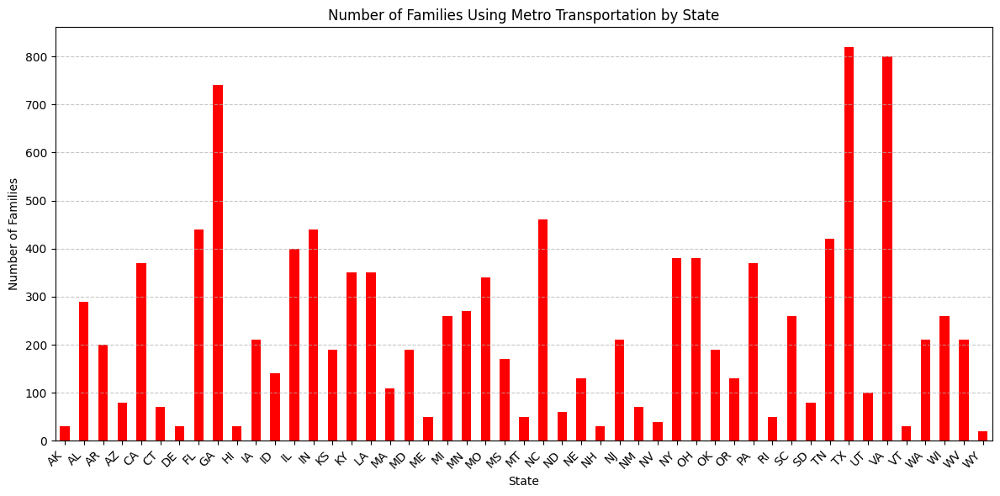

In [16]:
metro_families = cost_of_living_us[cost_of_living_us['isMetro'] == True]
metro_count = metro_families.groupby('state')['case_id'].count().sort_index()

plt.figure(figsize=(12, 6))
metro_count.plot(kind='bar', color='red')
plt.title('Number of Families Using Metro Transportation by State')
plt.xlabel('State')
plt.ylabel('Number of Families')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

## Family Income Distributions Based on Metro Use

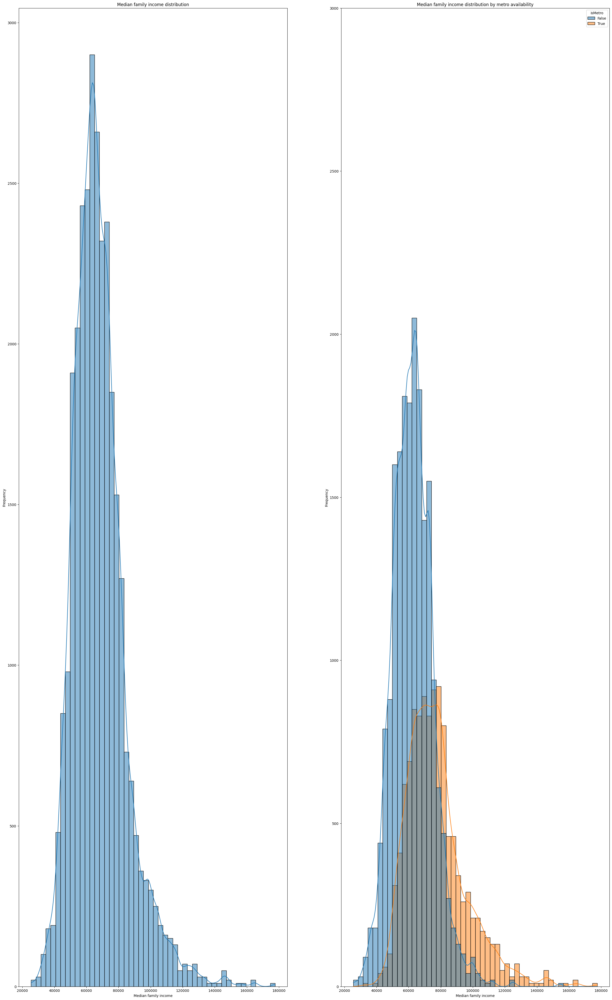

In [17]:
fig, ax = plt.subplots(1, 2, figsize=(30, 50), gridspec_kw={'width_ratios': [1, 1]})

sns.histplot(data=cost_of_living_us, x='median_family_income', kde=True, bins=50, ax=ax[0])

ax[0].set_title('Median family income distribution')
ax[0].set_xlabel('Median family income')
ax[0].set_ylabel('Frequency')

sns.histplot(data=cost_of_living_us, x='median_family_income', kde=True, bins=50, ax=ax[1], hue='isMetro')

# Configure the plot
ax[1].set_yticks(ticks=np.arange(0, 3001, 500))
ax[1].set_title('Median family income distribution by metro availability')
ax[1].set_xlabel('Median family income')
ax[1].set_ylabel('Frequency')

# Display plots
plt.show()


# Feature Engineering with Data

## Average Cost per State

Top Ten Most Expensive States:
Hawaii: $91698.34
Massachusetts: $83745.18
California: $82417.83
New Jersey: $77512.70
Connecticut: $76389.11
Vermont: $71562.19
Oregon: $71402.63
Delaware: $70186.38
Alaska: $70040.17
Wyoming: $68834.52


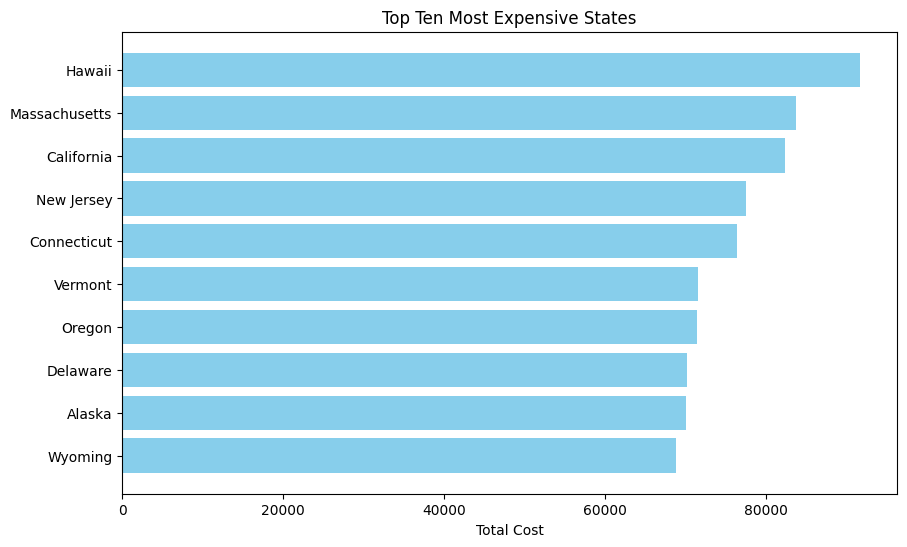

In [18]:
# Calculate total cost for each row
cost_of_living_us['total_cost'] = (
    cost_of_living_us['housing_cost'] +
    cost_of_living_us['food_cost'] +
    cost_of_living_us['healthcare_cost'] +
    cost_of_living_us['transportation_cost'] + 
    cost_of_living_us['other_necessities_cost'] + 
    cost_of_living_us['taxes']
)

# Group by state and calculate the average total cost per state
avg_total_cost_state = cost_of_living_us.groupby('state')['total_cost'].mean().sort_values(ascending=False)
# Get the ten most expensive states
top_10_expensive_states = avg_total_cost_state.head(10)
lookup = {item['state_abb']: item['state'] for item in state_abb_list}
print('Top Ten Most Expensive States:')
for state_abb, cost in top_10_expensive_states.items():
    state = lookup.get(state_abb, 'State not found')
    print(f"{state}: ${cost:.2f}")
    
states = [lookup.get(state_abb, 'State not found') for state_abb in top_10_expensive_states.index]
costs = top_10_expensive_states.values

# Plotting the bar graph
plt.figure(figsize=(10, 6))
plt.barh(states, costs, color='skyblue')
plt.xlabel('Total Cost')
plt.title('Top Ten Most Expensive States')
plt.gca().invert_yaxis()  # Invert y-axis to have the most expensive state at the top
plt.show()

## Top Ten Most Expensive Counties

Top Ten Most Expensive Counties:
San Mateo County, San Francisco, California: $149188.88
Marin County, San Francisco, California: $140459.57
San Francisco County, San Francisco, California: $126686.81
Santa Cruz County, Santa Cruz-Watsonville, California: $122692.35
Santa Clara County, San Jose-Sunnyvale-Santa Clara, California: $118604.17
New York County, New York, New York: $108254.46
Contra Costa County, Oakland-Fremont, California: $105173.48
Alameda County, Oakland-Fremont, California: $104166.81
Santa Barbara County, Santa Maria-Santa Barbara, California: $103663.73
Putnam County, New York, New York: $103480.93


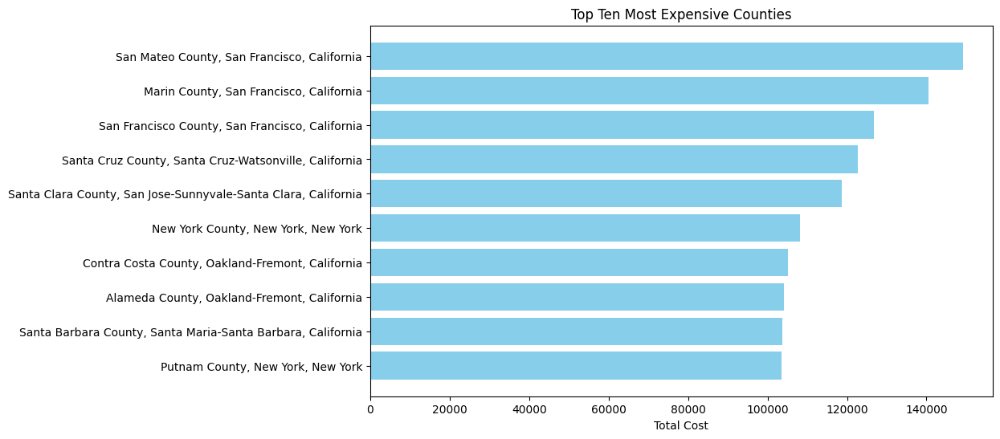

In [19]:
avg_total_cost_county = cost_of_living_us.groupby(['county', 'state', 'areaname'])['total_cost'].mean().sort_values(ascending=False).reset_index()
top_10_expensive_counties = avg_total_cost_county.head(10)
print('Top Ten Most Expensive Counties:')
counties = []
costs = []
for _, row in top_10_expensive_counties.iterrows():
    county_name = row['county']  # Remove "County" from the county name
    state_abb = row['state']
    state = lookup.get(state_abb, 'State not found')
    city = row['areaname'].split(',')[0]
    cost = row['total_cost']
    counties.append(f"{county_name}, {city}, {state}")
    costs.append(cost)
    print(f"{county_name}, {city}, {state}: ${cost:.2f}")

# Plotting the bar graph
plt.figure(figsize=(10, 6))
plt.barh(counties, costs, color='skyblue')
plt.xlabel('Total Cost')
plt.title('Top Ten Most Expensive Counties')
plt.gca().invert_yaxis()  # Invert y-axis to have the most expensive state at the top
plt.show()

## Components for Annual Average Cost Per State

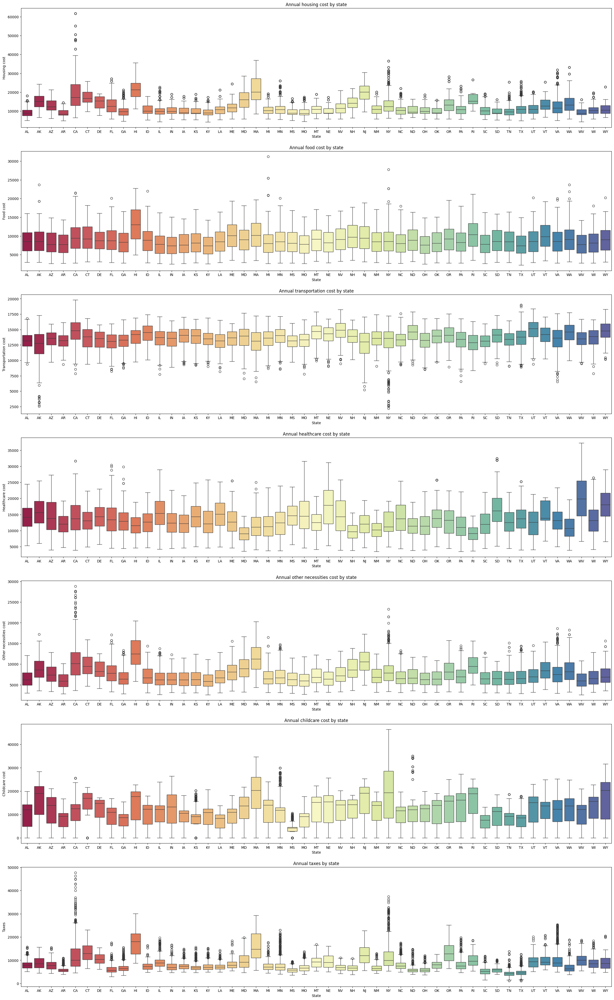

In [20]:
fig, ax = plt.subplots(7, 1, figsize=(30,50))

index = 0

for col in cost_of_living_us.iloc[:, 6:13].columns:
    sns.boxplot(data=cost_of_living_us, x='state', y=col, ax=ax[index], orient='v', palette='Spectral', hue='state', dodge=False)
    ax[index].set_title('Annual {} by state'.format(' '.join(col.split('_'))))
    ax[index].set_ylabel('{}'.format(' '.join(col.split('_')).capitalize()))
    ax[index].set_xlabel('State')
    index += 1
    
plt.show()

## Average Cost of Childcare Per State

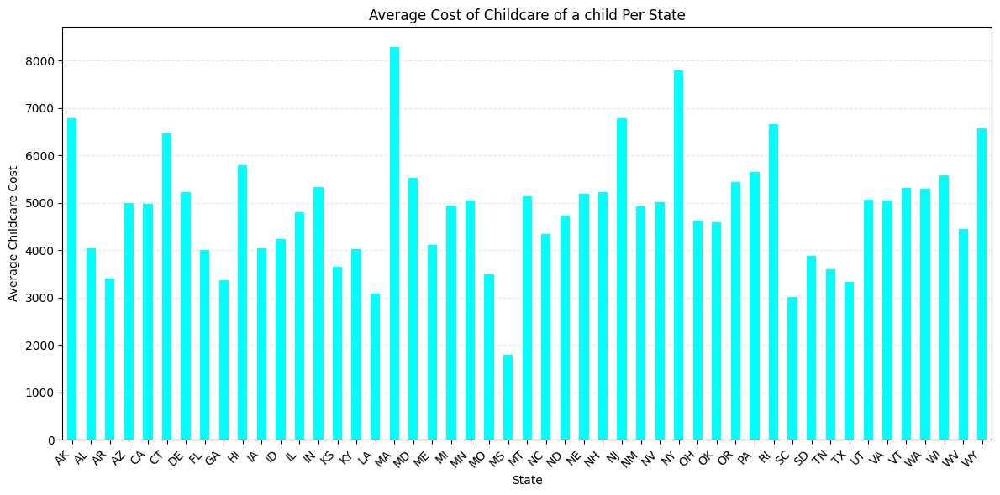

In [21]:
cost_of_living_us['num_children'] = cost_of_living_us['family_member_count'].apply(
    lambda x: int(re.search(r'(\d+)c', x).group(1)) if re.search(r'(\d+)c', x) else 0
)

cost_of_living_us['avg_childcare_cost'] = np.where(
    cost_of_living_us['num_children'] > 0,  # Condition: num_children > 0
    cost_of_living_us['childcare_cost'] / cost_of_living_us['num_children'],  # Division when condition is met
    0.0  # Replace with 'null' when num_children == 0
)

avg_childcare_cost = cost_of_living_us.groupby('state')['avg_childcare_cost'].mean().sort_index()

plt.figure(figsize=(12, 6))
avg_childcare_cost.plot(kind='bar', color='cyan')
plt.title('Average Cost of Childcare of a child Per State')
plt.xlabel('State')
plt.ylabel('Average Childcare Cost')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

## Total Costs for Families with Children


Top Ten Most Expensive States for Families With Children:
Hawaii: $104897.26
Massachusetts: $101891.58
California: $93179.16
New Jersey: $92575.26
Connecticut: $90013.50
New York: $86764.05
Alaska: $85234.56
Wyoming: $84289.77
Oregon: $83818.03
Rhode Island: $83512.77
Number of families with at least 1 child: 24616


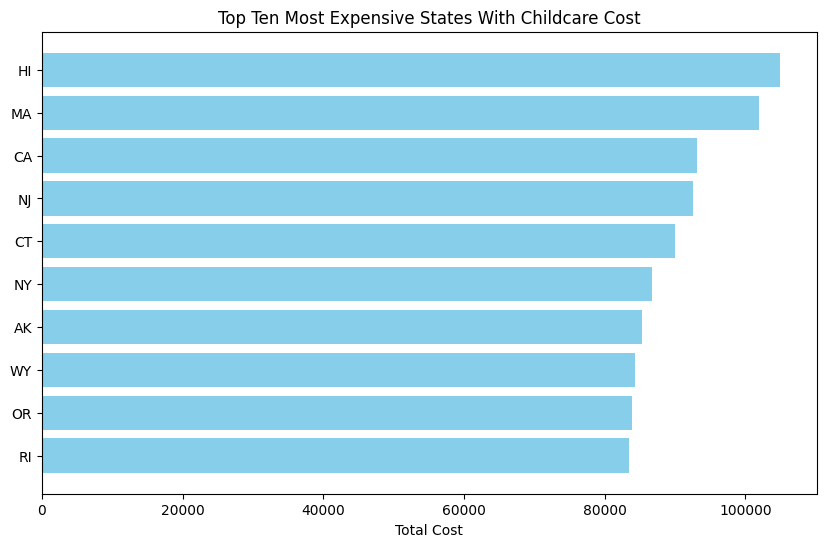

In [22]:
cost_of_living_us['total_cost'] = (
    cost_of_living_us['housing_cost'] +
    cost_of_living_us['food_cost'] +
    cost_of_living_us['healthcare_cost'] +
    cost_of_living_us['transportation_cost'] + 
    cost_of_living_us['other_necessities_cost'] + 
    cost_of_living_us['taxes'] + 
    cost_of_living_us['childcare_cost']
)

avg_total_cost = cost_of_living_us.groupby('state')['total_cost'].mean().sort_values(ascending=False)
# Get the ten most expensive states
top_10_expensive_states = avg_total_cost.head(10)
lookup = {item['state_abb']: item['state'] for item in state_abb_list}
print('Top Ten Most Expensive States for Families With Children:')
for state_abb, cost in top_10_expensive_states.items():
    state = lookup.get(state_abb, 'State not found')
    print(f"{state}: ${cost:.2f}")

num_families_with_children = cost_of_living_us[cost_of_living_us['num_children'] >= 1].shape[0]
print(f"Number of families with at least 1 child: {num_families_with_children}")

states_children = [county for county in top_10_expensive_states.index]
costs = top_10_expensive_states.values

# Plotting the bar graph
plt.figure(figsize=(10, 6))
plt.barh(states_children, costs, color='skyblue')
plt.xlabel('Total Cost')
plt.title('Top Ten Most Expensive States With Childcare Cost')
plt.gca().invert_yaxis()  # Invert y-axis to have the most expensive state at the top
plt.show()

In [23]:
# Apply the regex to each row within each group, not to the whole group
cost_of_living_us['num_parents'] = cost_of_living_us['family_member_count'].transform(
    lambda x: x.apply(lambda val: int(re.search(r'(\d+)p', val).group(1)) if re.search(r'(\d+)p', val) else 0)
)

cost_of_living_us['num_children'] = cost_of_living_us['family_member_count'].apply(
    lambda x: int(re.search(r'(\d+)c', x).group(1)) if re.search(r'(\d+)c', x) else 0
)

# Calculate the family size
cost_of_living_us['family_size'] = cost_of_living_us['num_parents'] + cost_of_living_us['num_children']

cost_of_living_us.head()

,case_id,state,isMetro,areaname,county,family_member_count,housing_cost,food_cost,transportation_cost,healthcare_cost,...,female_life_expectancy,state_population,crime_rate,violent_crime_rate,environment_score,happiness_score,num_children,avg_childcare_cost,num_parents,family_size
0,1,AL,True,"Montgomery, AL MSA",Autauga County,1p0c,8505.72876,3454.91712,10829.16876,5737.47984,...,76.4,5074296,21.48,4.09,36.45,40.82,0,0.0000,1,1
1,1,AL,True,"Montgomery, AL MSA",Autauga County,1p1c,12067.50240,5091.70788,11588.19288,8659.55640,...,76.4,5074296,21.48,4.09,36.45,40.82,1,6147.8298,1,2
2,1,AL,True,"Montgomery, AL MSA",Autauga County,1p2c,12067.50240,7460.20308,12361.77720,11581.63260,...,76.4,5074296,21.48,4.09,36.45,40.82,2,7912.3470,1,3
3,1,AL,True,"Montgomery, AL MSA",Autauga County,1p3c,15257.15040,9952.23924,13452.18600,14503.70760,...,76.4,5074296,21.48,4.09,36.45,40.82,3,6267.3964,1,4
4,1,AL,True,"Montgomery, AL MSA",Autauga County,1p4c,15257.15040,12182.21400,13744.59840,17425.78560,...,76.4,5074296,21.48,4.09,36.45,40.82,4,4700.5473,1,5


## Affordability for Families Depending on number of Children

In [24]:
cost_of_living_us['affordability_score'] = (1 - cost_of_living_us['total_cost'] / cost_of_living_us['median_family_income'])


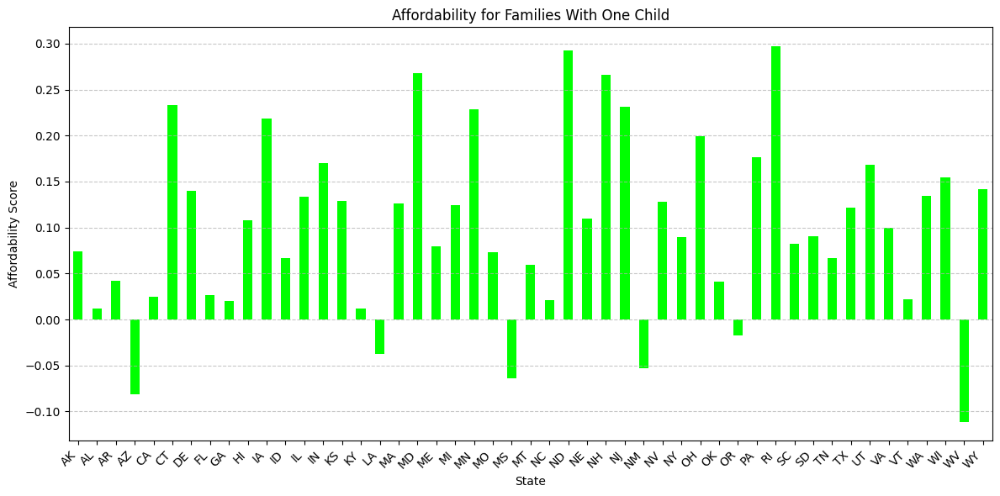

In [25]:
# 1 Child
cost_of_living_us['affordability_one_child'] = np.where(
    cost_of_living_us['num_children'] == 1,  # Condition
    cost_of_living_us['affordability_score'],  # Value if True
    np.nan  # Value if False (set to NaN so it is ignored in the mean)
)

affordability_one = cost_of_living_us.groupby('state')['affordability_one_child'].mean().sort_index()

plt.figure(figsize=(12, 6))
affordability_one.plot(kind='bar', color='lime')
plt.title('Affordability for Families With One Child')
plt.xlabel('State')
plt.ylabel('Affordability Score')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

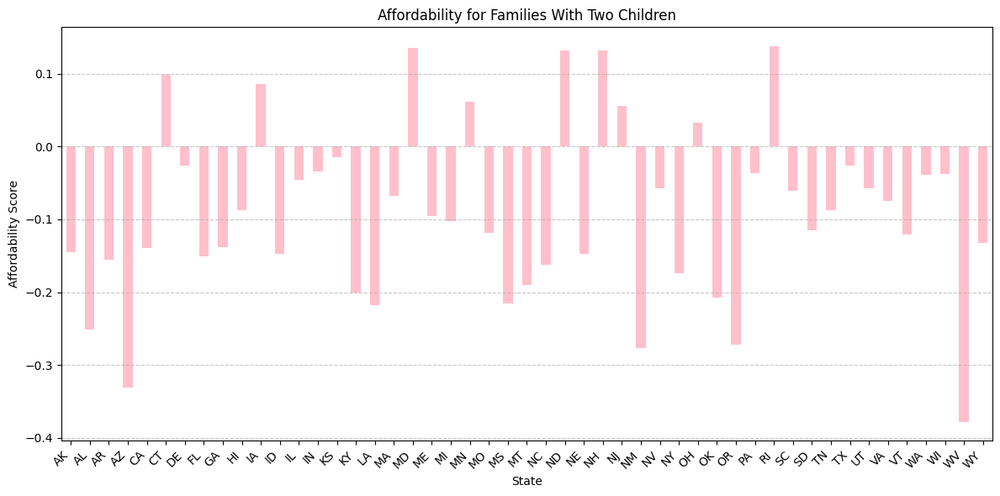

In [26]:
# 2 Children
cost_of_living_us['affordability_two_children'] = np.where(
    cost_of_living_us['num_children'] == 2,  # Condition
    cost_of_living_us['affordability_score'],  # Value if True
    np.nan  # Value if False (set to NaN so it is ignored in the mean)
)

affordability_two = cost_of_living_us.groupby('state')['affordability_two_children'].mean().sort_index()

plt.figure(figsize=(12, 6))
affordability_two.plot(kind='bar', color='pink')
plt.title('Affordability for Families With Two Children')
plt.xlabel('State')
plt.ylabel('Affordability Score')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

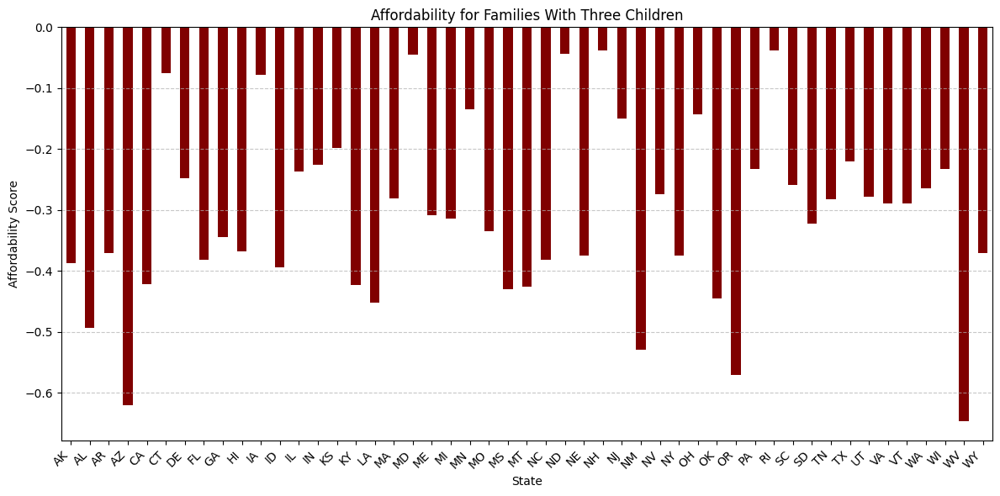

In [27]:
# 3 Children
cost_of_living_us['affordability_three_children'] = np.where(
    cost_of_living_us['num_children'] == 3,  # Condition
    cost_of_living_us['affordability_score'],  # Value if True
    np.nan  # Value if False (set to NaN so it is ignored in the mean)
)

affordability_three = cost_of_living_us.groupby('state')['affordability_three_children'].mean().sort_index()

plt.figure(figsize=(12, 6))
affordability_three.plot(kind='bar', color='maroon')
plt.title('Affordability for Families With Three Children')
plt.xlabel('State')
plt.ylabel('Affordability Score')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

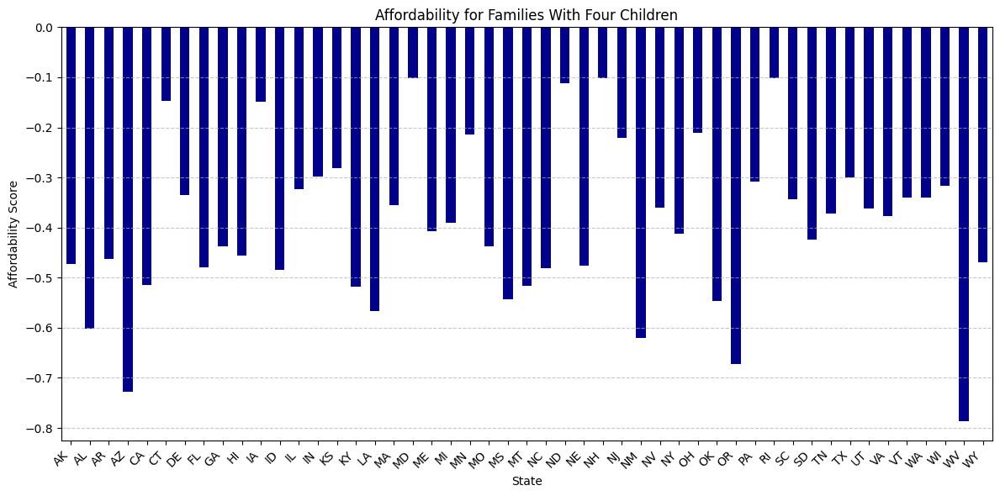

In [28]:
# 4 Children
cost_of_living_us['affordability_four_children'] = np.where(
    cost_of_living_us['num_children'] == 4,  # Condition
    cost_of_living_us['affordability_score'],  # Value if True
    np.nan  # Value if False (set to NaN so it is ignored in the mean)
)

affordability_four = cost_of_living_us.groupby('state')['affordability_four_children'].mean().sort_index()

plt.figure(figsize=(12, 6))
affordability_four.plot(kind='bar', color='darkblue')
plt.title('Affordability for Families With Four Children')
plt.xlabel('State')
plt.ylabel('Affordability Score')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [29]:
# Do not need individual affordability columns any more

cost_of_living_us.drop(['affordability_one_child', 'affordability_two_children', 'affordability_three_children', 'affordability_four_children'], axis=1, inplace=True)

In [30]:
# to show columns were dropped
cost_of_living_us.head()

,case_id,state,isMetro,areaname,county,family_member_count,housing_cost,food_cost,transportation_cost,healthcare_cost,...,state_population,crime_rate,violent_crime_rate,environment_score,happiness_score,num_children,avg_childcare_cost,num_parents,family_size,affordability_score
0,1,AL,True,"Montgomery, AL MSA",Autauga County,1p0c,8505.72876,3454.91712,10829.16876,5737.47984,...,5074296,21.48,4.09,36.45,40.82,0,0.0000,1,1,0.462350
1,1,AL,True,"Montgomery, AL MSA",Autauga County,1p1c,12067.50240,5091.70788,11588.19288,8659.55640,...,5074296,21.48,4.09,36.45,40.82,1,6147.8298,1,2,0.216628
2,1,AL,True,"Montgomery, AL MSA",Autauga County,1p2c,12067.50240,7460.20308,12361.77720,11581.63260,...,5074296,21.48,4.09,36.45,40.82,2,7912.3470,1,3,-0.042879
3,1,AL,True,"Montgomery, AL MSA",Autauga County,1p3c,15257.15040,9952.23924,13452.18600,14503.70760,...,5074296,21.48,4.09,36.45,40.82,3,6267.3964,1,4,-0.290275
4,1,AL,True,"Montgomery, AL MSA",Autauga County,1p4c,15257.15040,12182.21400,13744.59840,17425.78560,...,5074296,21.48,4.09,36.45,40.82,4,4700.5473,1,5,-0.380947


## Total Cost Changes With Family Size

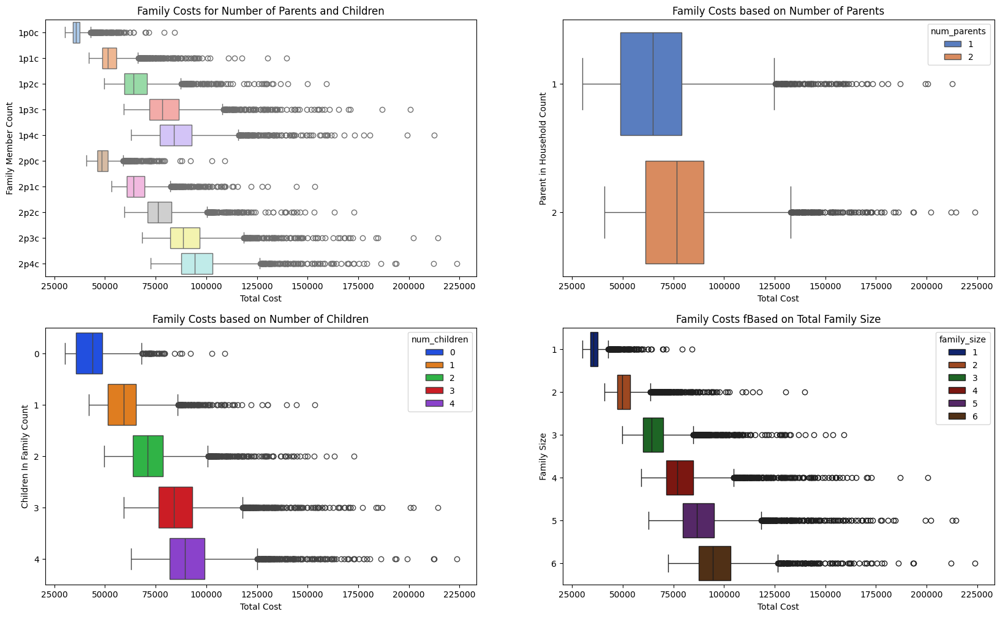

In [31]:
fig, ax = plt.subplots(2, 2, figsize=(20,12))

sns.boxplot(cost_of_living_us, x='total_cost', y='family_member_count', orient='h', ax=ax[0,0], palette='pastel', hue='family_member_count')

ax[0,0].set_title('Family Costs for Number of Parents and Children')
ax[0,0].set_xlabel('Total Cost')
ax[0,0].set_ylabel('Family Member Count')

sns.boxplot(cost_of_living_us, x='total_cost', y='num_parents', orient='h', ax=ax[0,1], palette='muted', hue='num_parents')

ax[0,1].set_title('Family Costs based on Number of Parents')
ax[0,1].set_xlabel('Total Cost')
ax[0,1].set_ylabel('Parent in Household Count')

sns.boxplot(cost_of_living_us, x='total_cost', y='num_children', orient='h', ax=ax[1,0], palette='bright', hue='num_children')

ax[1,0].set_title('Family Costs based on Number of Children')
ax[1,0].set_xlabel('Total Cost')
ax[1,0].set_ylabel('Children In Family Count')

sns.boxplot(cost_of_living_us, x='total_cost', y='family_size', orient='h', ax=ax[1,1], palette='dark', hue='family_size')

ax[1,1].set_title('Family Costs fBased on Total Family Size')
ax[1,1].set_xlabel('Total Cost')
ax[1,1].set_ylabel('Family Size')

plt.show()

## Average Family Income Per State along with Average Income in the United States

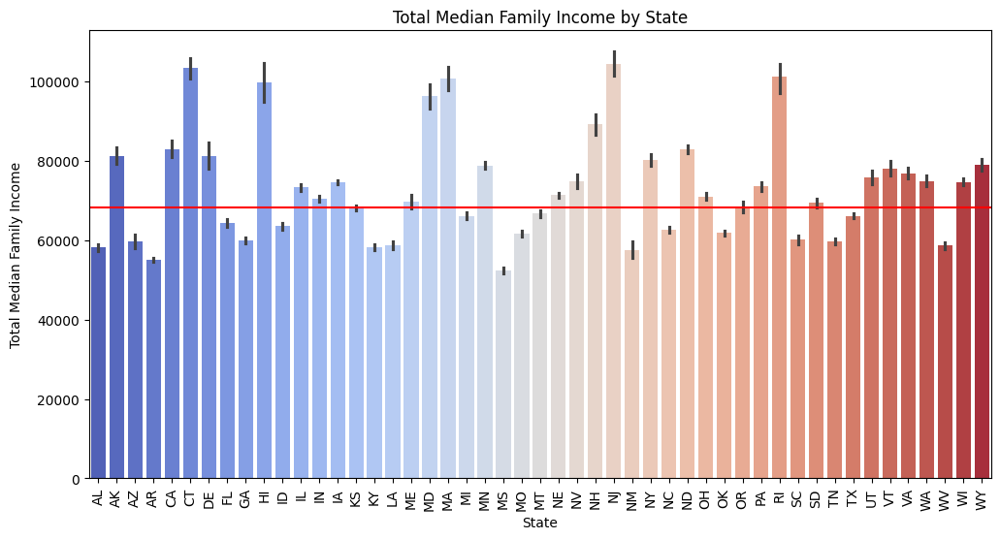

Average Median Income: $ 68157.98


In [32]:
plt.figure(figsize=(12,6))
sns.barplot(x='state', y='median_family_income', data=cost_of_living_us, palette='coolwarm', hue='state')
plt.axhline(y=cost_of_living_us['median_family_income'].mean(), color='r')
plt.xlabel('State')
plt.ylabel('Total Median Family Income')
plt.title('Total Median Family Income by State')
plt.xticks(rotation=90)
plt.show()

print(f"Average Median Income: $ {cost_of_living_us['median_family_income'].mean():.2f}")

## Total Costs in the United States

C:\Users\yashk\AppData\Local\Temp\ipykernel_21328\2038822057.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=costs, x='Total Money Spent on Cost', y='Cost Type', orient='h', palette='Dark2')


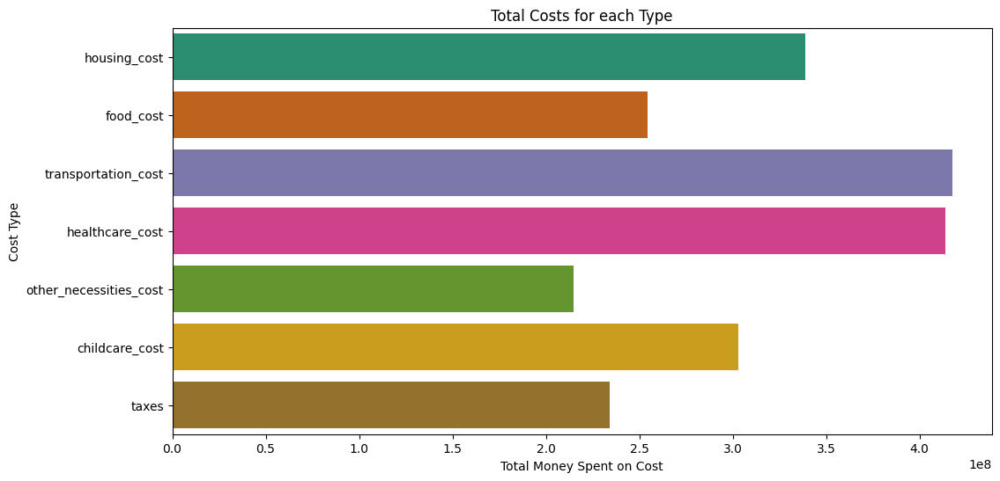

In [33]:
cost_columns = ['housing_cost', 'food_cost', 'transportation_cost', 'healthcare_cost', 'other_necessities_cost', 'childcare_cost', 'taxes']
costs = cost_of_living_us[cost_columns].sum().reset_index()
costs.columns = ['Cost Type', 'Total Money Spent on Cost']
plt.figure(figsize=(12,6))
sns.barplot(data=costs, x='Total Money Spent on Cost', y='Cost Type', orient='h', palette='Dark2')
plt.xlabel('Total Money Spent on Cost')
plt.ylabel('Cost Type')
plt.title('Total Costs for each Type')
plt.show()

## Correlation Matrix for Costs and Income

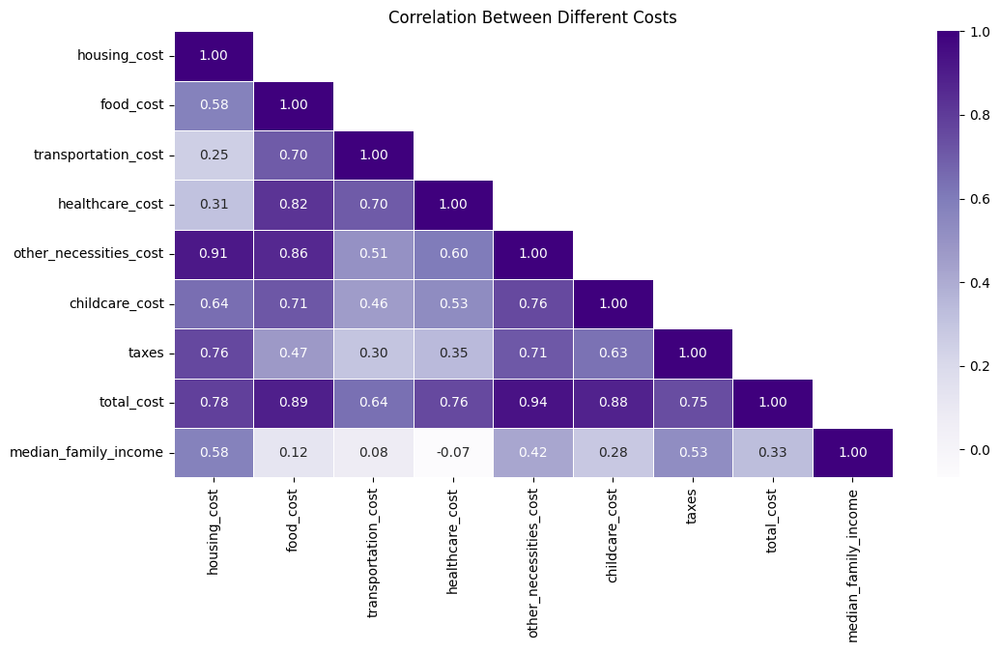

Top 3 strongest correlations for 'Housing cost': ['other_necessities_cost', 'total_cost', 'taxes']
Top 3 strongest correlations for 'Food cost': ['total_cost', 'other_necessities_cost', 'healthcare_cost']
Top 3 strongest correlations for 'Transportation cost': ['healthcare_cost', 'food_cost', 'total_cost']
Top 3 strongest correlations for 'Healthcare cost': ['food_cost', 'total_cost', 'transportation_cost']
Top 3 strongest correlations for 'Other necessities cost': ['total_cost', 'housing_cost', 'food_cost']
Top 3 strongest correlations for 'Childcare cost': ['total_cost', 'other_necessities_cost', 'food_cost']
Top 3 strongest correlations for 'Taxes': ['housing_cost', 'total_cost', 'other_necessities_cost']
Top 3 strongest correlations for 'Total cost': ['other_necessities_cost', 'food_cost', 'childcare_cost']
Top 3 strongest correlations for 'Median family income': ['housing_cost', 'taxes', 'other_necessities_cost']


In [34]:
cost_correlation_matrix = cost_of_living_us.iloc[:, 6:15].corr()

plt.figure(figsize=(12, 6))
up = np.triu(cost_of_living_us.iloc[:, 6:15].corr(), k=1) # hides upper triangle
sns.heatmap(cost_correlation_matrix, annot=True, cmap='Purples', fmt='.2f', linewidths=0.5, mask=up)
plt.title('Correlation Between Different Costs')
plt.show()

strongest_cost_correlations = {}
for col in cost_correlation_matrix.columns:
    sorted_corr = cost_correlation_matrix[col].drop(col).abs().sort_values(ascending=False)
    top3 = sorted_corr.head(3).index.tolist()
    strongest_cost_correlations[col] = top3
    
for col, top_factors in strongest_cost_correlations.items():
    print(f"Top 3 strongest correlations for '{' '.join(col.split('_')).capitalize()}': {top_factors}")


## Correlation Matrix for Life Quality Scores and Income

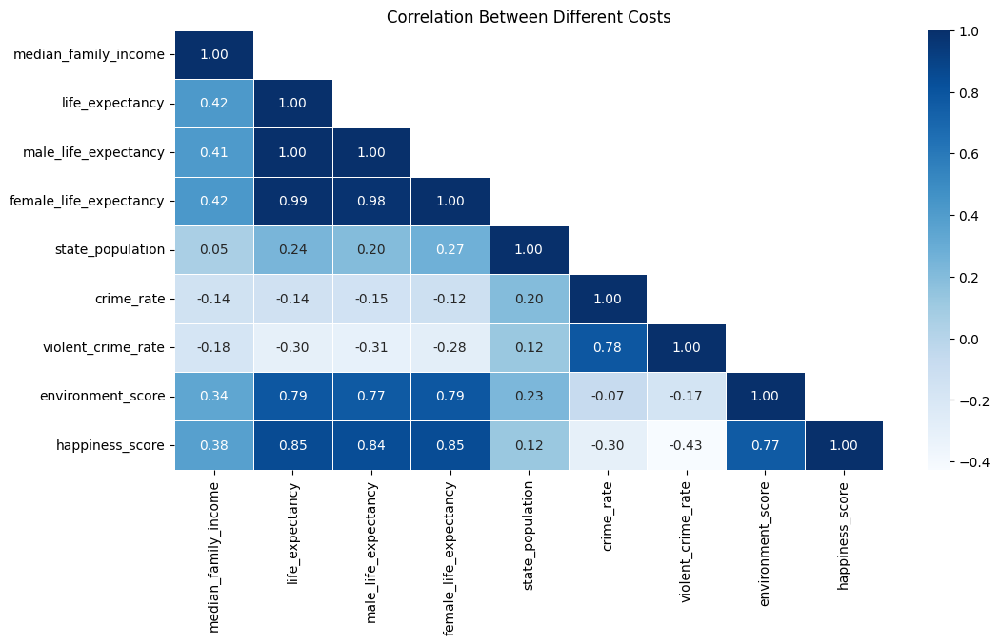

Top 3 strongest correlations for 'Median family income': ['female_life_expectancy', 'life_expectancy', 'male_life_expectancy']
Top 3 strongest correlations for 'Life expectancy': ['male_life_expectancy', 'female_life_expectancy', 'happiness_score']
Top 3 strongest correlations for 'Male life expectancy': ['life_expectancy', 'female_life_expectancy', 'happiness_score']
Top 3 strongest correlations for 'Female life expectancy': ['life_expectancy', 'male_life_expectancy', 'happiness_score']
Top 3 strongest correlations for 'State population': ['female_life_expectancy', 'life_expectancy', 'environment_score']
Top 3 strongest correlations for 'Crime rate': ['violent_crime_rate', 'happiness_score', 'state_population']
Top 3 strongest correlations for 'Violent crime rate': ['crime_rate', 'happiness_score', 'male_life_expectancy']
Top 3 strongest correlations for 'Environment score': ['female_life_expectancy', 'life_expectancy', 'male_life_expectancy']
Top 3 strongest correlations for 'Happine

In [35]:
score_correlation_matrix = cost_of_living_us.iloc[:, 14:23].corr()

plt.figure(figsize=(12, 6))
up = np.triu(cost_of_living_us.iloc[:, 6:15].corr(), k=1) # hides upper triangle
sns.heatmap(score_correlation_matrix, annot=True, cmap='Blues', fmt='.2f', linewidths=0.5, mask=up)
plt.title('Correlation Between Different Costs')
plt.show()

strongest_score_correlations = {}
for col in score_correlation_matrix.columns:
    sorted_corr = score_correlation_matrix[col].drop(col).abs().sort_values(ascending=False)
    top3 = sorted_corr.head(3).index.tolist()
    strongest_score_correlations[col] = top3
    
for col, top_factors in strongest_score_correlations.items():
    print(f"Top 3 strongest correlations for '{' '.join(col.split('_')).capitalize()}': {top_factors}")

## Linear and Logistic Regressions

In [36]:
x = cost_of_living_us[cost_columns]
y = cost_of_living_us['median_family_income']
# Combine X and y into a single DataFrame
data = pd.concat([x, y], axis=1)

# Remove rows with NaN or infinite values
data = data.replace([np.inf, -np.inf], np.nan).dropna()

# Separate X and y after cleaning
X_clean = data[cost_columns]
y_clean = data['median_family_income']

X_train, X_test, y_train, y_test = train_test_split(X_clean, y_clean, test_size=0.2, random_state=42)

model = LinearRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)  # RMSE is the square root of MSE

print(f"R² Score: {r2:.2f}")
print(f"Mean Absolute Error (MAE): ${mae:.2f}")
print(f"Mean Squared Error (MSE): ${mse:.2f}")
print(f"Root Mean Squared Error (RMSE): ${rmse:.2f}")

R² Score: 0.47
Mean Absolute Error (MAE): $9153.88
Mean Squared Error (MSE): $146196996.71
Root Mean Squared Error (RMSE): $12091.20


R² Score for housing_cost: 0.33303968105109083
Equation for housing_cost: y = 2.35x + 42269.31


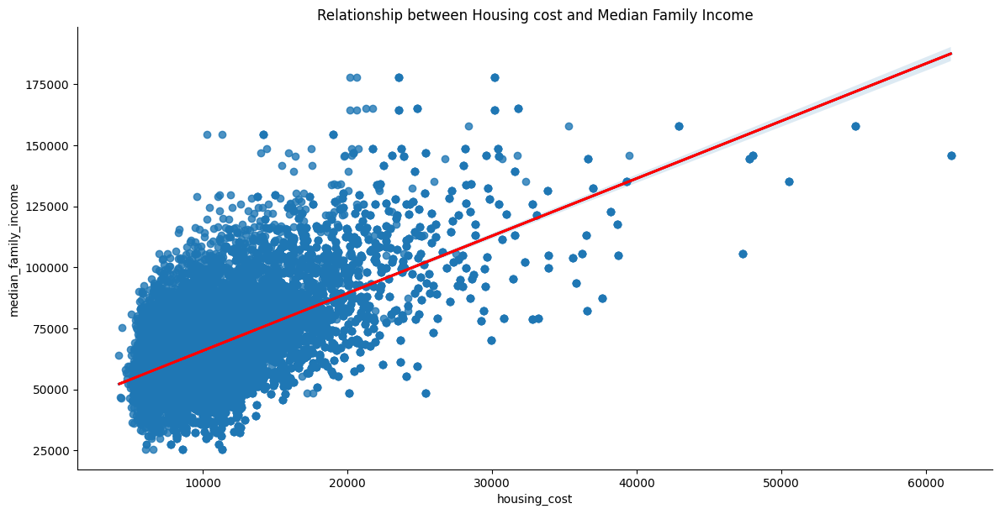

R² Score for food_cost: 0.014954951548355244
Equation for food_cost: y = 0.63x + 62964.86


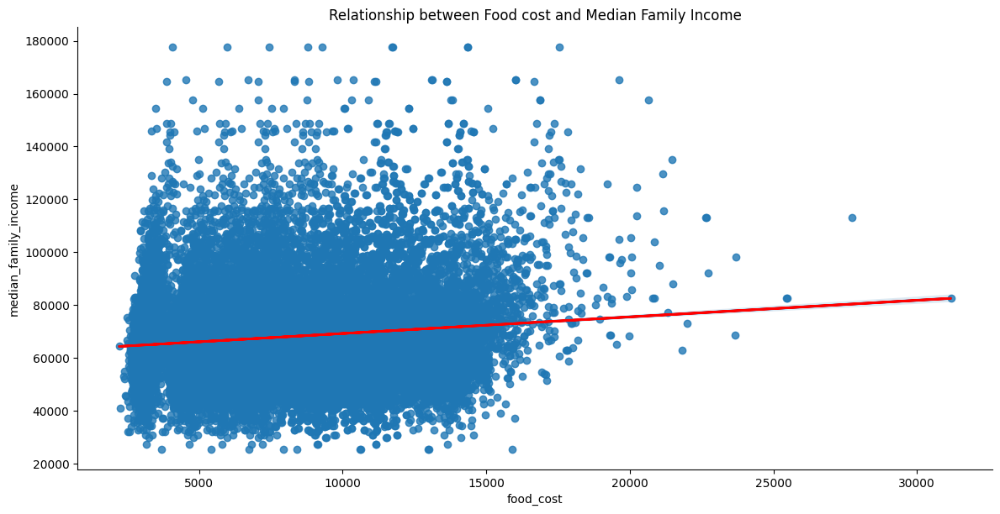

R² Score for transportation_cost: 0.006256854119504718
Equation for transportation_cost: y = 0.81x + 57116.72


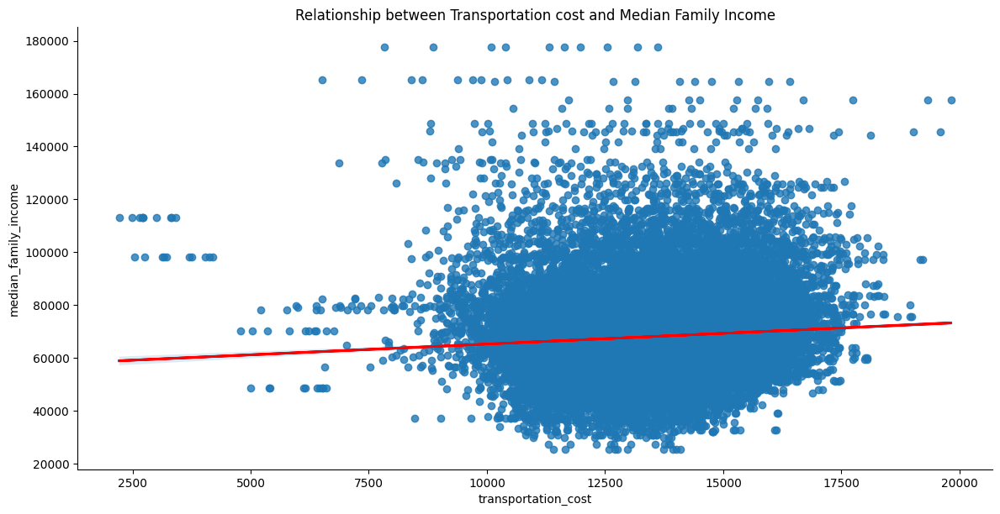

R² Score for healthcare_cost: 0.004450320872738001
Equation for healthcare_cost: y = -0.21x + 71041.46


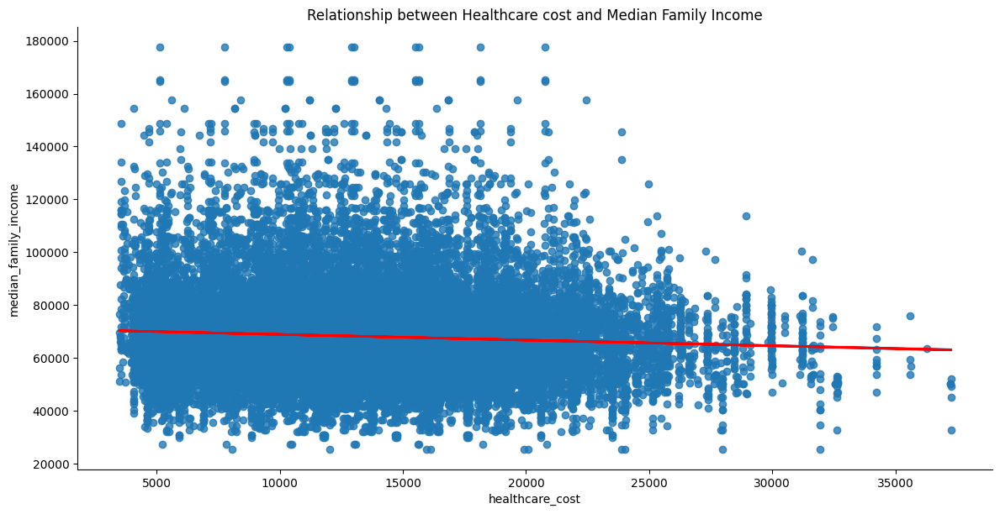

R² Score for other_necessities_cost: 0.17853990546252796
Equation for other_necessities_cost: y = 2.98x + 47352.16


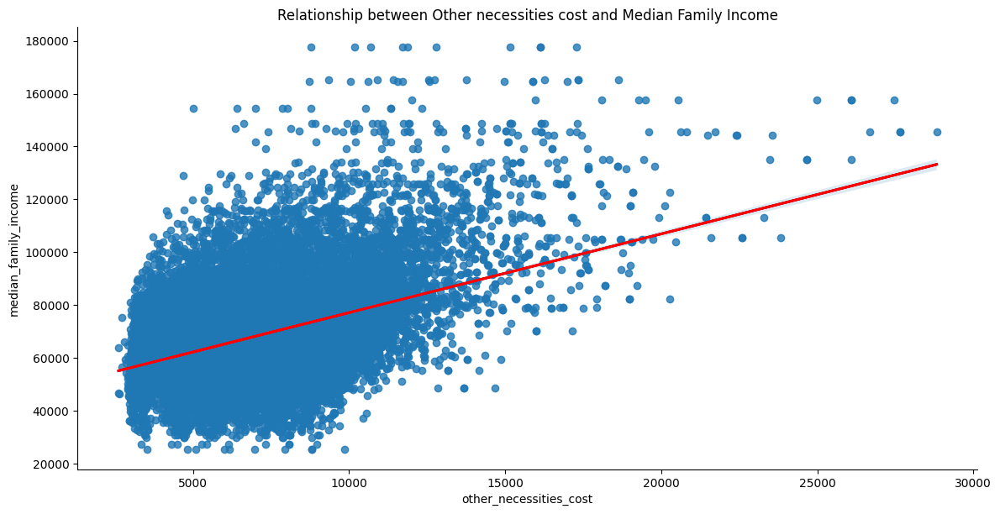

R² Score for childcare_cost: 0.21299346526665552
Equation for childcare_cost: y = 1.50x + 49759.00


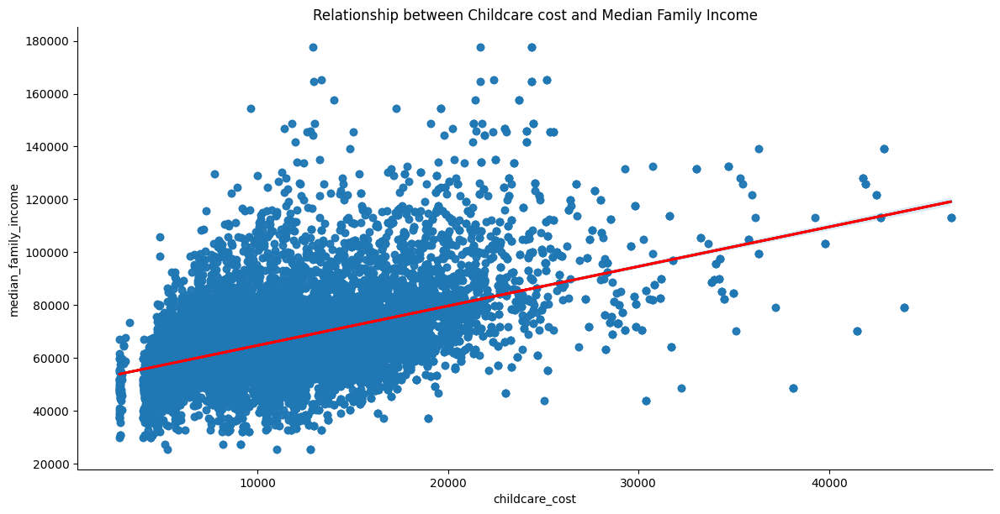

R² Score for taxes: 0.27878313566036494
Equation for taxes: y = 2.67x + 47791.08


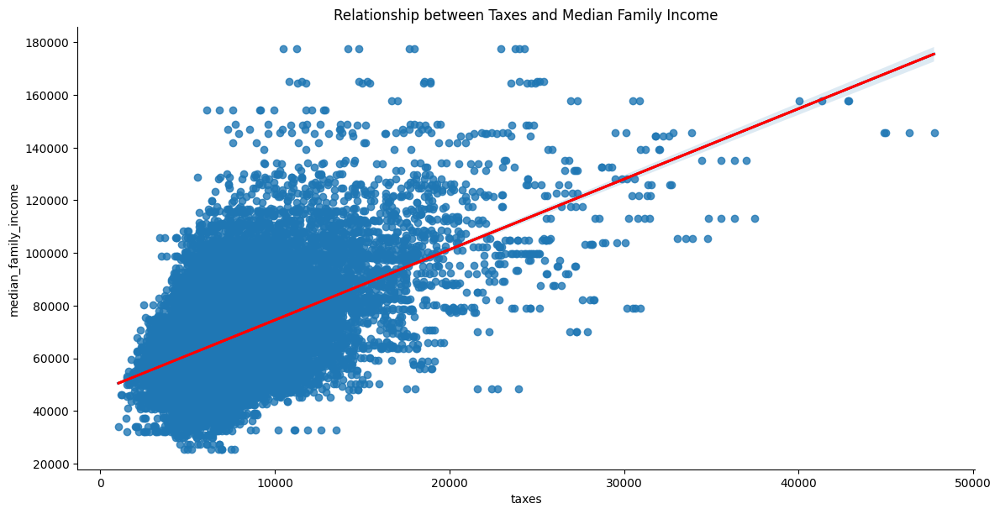

In [37]:
for feature in X_clean.columns: # Individual relationships between cost and median family income
    if feature== 'childcare_cost':
        data_filtered = data[data['childcare_cost'] > 0]
    else:
        data_filtered = data
    
    sns.lmplot(x=feature, y='median_family_income', data=data_filtered, aspect=2, height=6)
    b, yint = np.polyfit(data_filtered[feature], data_filtered['median_family_income'], 1)
    y_pred = b * data_filtered[feature] + yint
    ss_total = np.sum((data_filtered['median_family_income'] - np.mean(data_filtered['median_family_income']))**2)
    ss_residual = np.sum((data_filtered['median_family_income'] - y_pred)**2)
    r_squared = 1 - (ss_residual / ss_total)
    print(f"R² Score for {feature}: {r_squared}")
    print(f"Equation for {feature}: y = {b:.2f}x + {yint:.2f}")
    plt.title(f'Relationship between {" ".join(feature.split("_")).capitalize()} and Median Family Income')
    plt.plot(data_filtered[feature], y_pred, color='red', linewidth=2)  # Plot the regression line in red
    plt.show()

In [38]:
cost_of_living_us.info()

<class 'pandas.core.frame.DataFrame'>
Index: 30770 entries, 0 to 31429
Data columns (total 28 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   case_id                 30770 non-null  int64  
 1   state                   30770 non-null  object 
 2   isMetro                 30770 non-null  bool   
 3   areaname                30770 non-null  object 
 4   county                  30770 non-null  object 
 5   family_member_count     30770 non-null  object 
 6   housing_cost            30770 non-null  float64
 7   food_cost               30770 non-null  float64
 8   transportation_cost     30770 non-null  float64
 9   healthcare_cost         30770 non-null  float64
 10  other_necessities_cost  30770 non-null  float64
 11  childcare_cost          30770 non-null  float64
 12  taxes                   30770 non-null  float64
 13  total_cost              30770 non-null  float64
 14  median_family_income    30770 non-null  flo

## 3D Regression Between Male Life Expectancy, Happiness Score, and Income

Equation of the regression plane: z = -171589.89 + 2999.09 * x + 439.70 * y
R^2 score: 0.49030585156219464


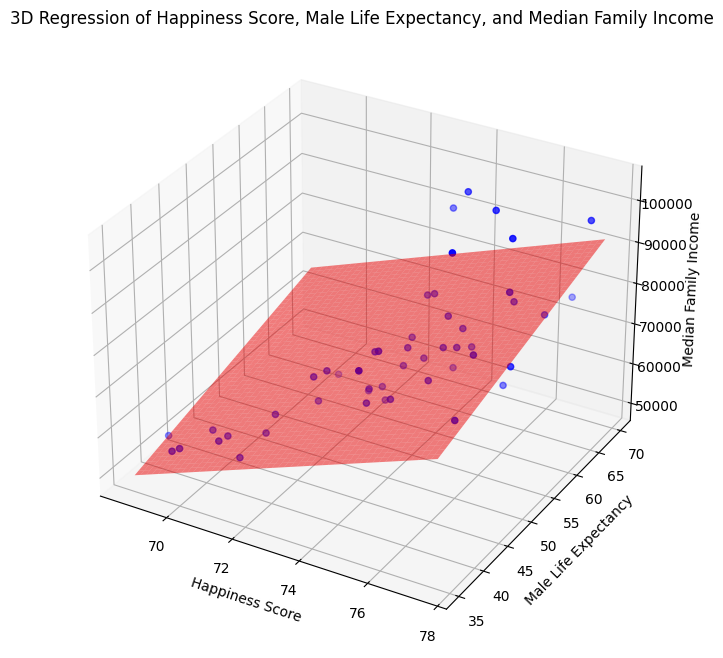

In [40]:
X = cost_of_living_us.groupby('state')[['male_life_expectancy', 'happiness_score']].mean().values.reshape(-1, 2) # same across all counties
Y = cost_of_living_us.groupby('state')['median_family_income'].mean().values # same across all counties

model = LinearRegression()

model.fit(X, Y)

b0 = model.intercept_
b1, b2 = model.coef_
print(f"Equation of the regression plane: z = {b0:.2f} + {b1:.2f} * x + {b2:.2f} * y")

# Create a meshgrid for plotting the plane
xx_pred = np.linspace(X[:, 0].min(), X[:, 0].max(), 50)
yy_pred = np.linspace(X[:, 1].min(), X[:, 1].max(), 50)
xx_pred, yy_pred = np.meshgrid(xx_pred, yy_pred)
model_viz = np.array([xx_pred.flatten(), yy_pred.flatten()]).T

# Predict using the fitted model
predicted = model.predict(model_viz)
z_surf = predicted.reshape(xx_pred.shape)

# Calculate R^2 score
r2 = model.score(X, Y)
print(f"R^2 score: {r2}")

# Plotting the data points and the regression plane
plt.style.use('default')

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X[:, 0], X[:, 1], Y, color='blue', label='Data points')
ax.plot_surface(xx_pred, yy_pred, z_surf, color='red', alpha=0.5, label='Regression plane')

ax.set_xlabel('Happiness Score')
ax.set_ylabel('Male Life Expectancy')
ax.set_zlabel('Median Family Income')
ax.set_title('3D Regression of Happiness Score, Male Life Expectancy, and Median Family Income')

plt.show()

Equation of the regression plane: z = -292141.93 + 4418.03 * x + 271.29 * y
R^2 score: 0.5295975617134197


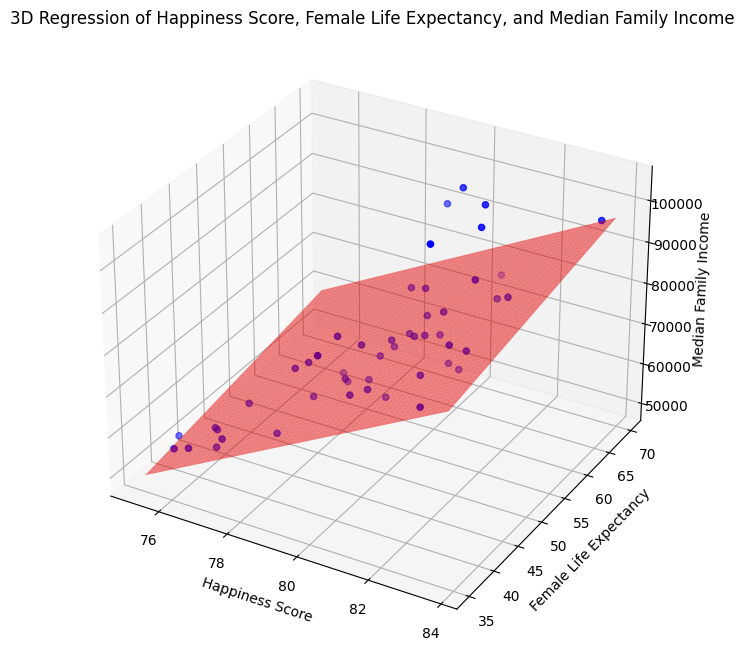

In [42]:
X = cost_of_living_us.groupby('state')[['female_life_expectancy', 'happiness_score']].mean().values.reshape(-1, 2) # same across all counties
Y = cost_of_living_us.groupby('state')['median_family_income'].mean().values # same across all counties

model = LinearRegression()

model.fit(X, Y)

b0 = model.intercept_
b1, b2 = model.coef_
print(f"Equation of the regression plane: z = {b0:.2f} + {b1:.2f} * x + {b2:.2f} * y")

# Create a meshgrid for plotting the plane
xx_pred = np.linspace(X[:, 0].min(), X[:, 0].max(), 50)
yy_pred = np.linspace(X[:, 1].min(), X[:, 1].max(), 50)
xx_pred, yy_pred = np.meshgrid(xx_pred, yy_pred)
model_viz = np.array([xx_pred.flatten(), yy_pred.flatten()]).T

# Predict using the fitted model
predicted = model.predict(model_viz)
z_surf = predicted.reshape(xx_pred.shape)

# Calculate R^2 score
r2 = model.score(X, Y)
print(f"R^2 score: {r2}")

# Plotting the data points and the regression plane
plt.style.use('default')

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X[:, 0], X[:, 1], Y, color='blue', label='Data points')
ax.plot_surface(xx_pred, yy_pred, z_surf, color='red', alpha=0.5, label='Regression plane')

ax.set_xlabel('Happiness Score')
ax.set_ylabel('Female Life Expectancy')
ax.set_zlabel('Median Family Income')
ax.set_title('3D Regression of Happiness Score, Female Life Expectancy, and Median Family Income')

plt.show()

## K-Means Classifier for Wealth Dependent on Income and Housing Cost

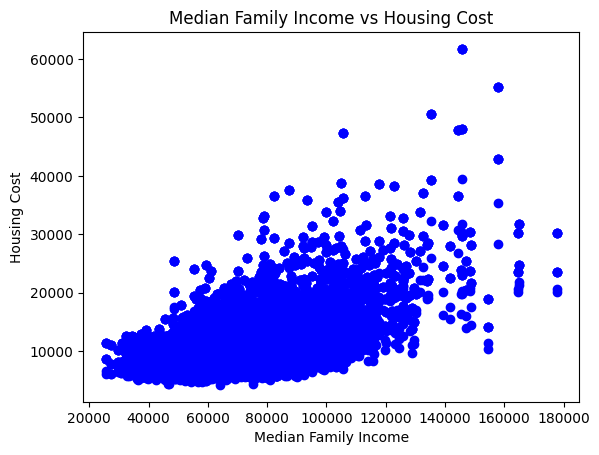

In [43]:
median_family_income = cost_of_living_us['median_family_income']
housing_cost = cost_of_living_us['housing_cost']

plt.scatter(median_family_income, housing_cost, color='blue')
plt.title('Median Family Income vs Housing Cost')
plt.xlabel('Median Family Income')
plt.ylabel('Housing Cost')
plt.show()

c:\Users\yashk\Dropbox\Rutgers\Rutgers CS\Projects\UnitedStatesStandardOfLiving\my_env\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\yashk\Dropbox\Rutgers\Rutgers CS\Projects\UnitedStatesStandardOfLiving\my_env\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\yashk\Dropbox\Rutgers\Rutgers CS\Projects\UnitedStatesStandardOfLiving\my_env\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_

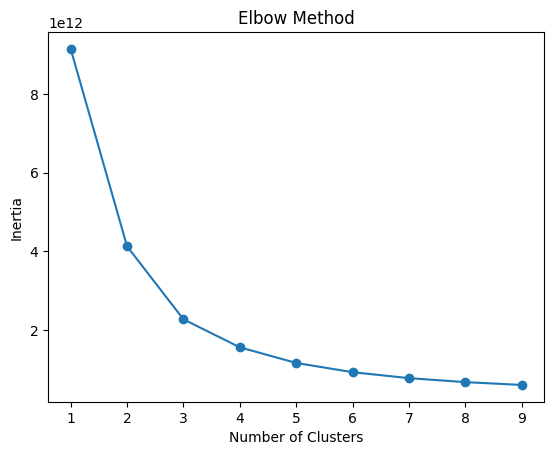

In [44]:
housing_income_data = list(zip(median_family_income, housing_cost))
inertias = []

for i in range(1,10):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(housing_income_data)
    inertias.append(kmeans.inertia_)
    
plt.plot(range(1,10), inertias, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.show()

## Using the Elbow Method, Ideal Number of Classifications is K=3

c:\Users\yashk\Dropbox\Rutgers\Rutgers CS\Projects\UnitedStatesStandardOfLiving\my_env\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


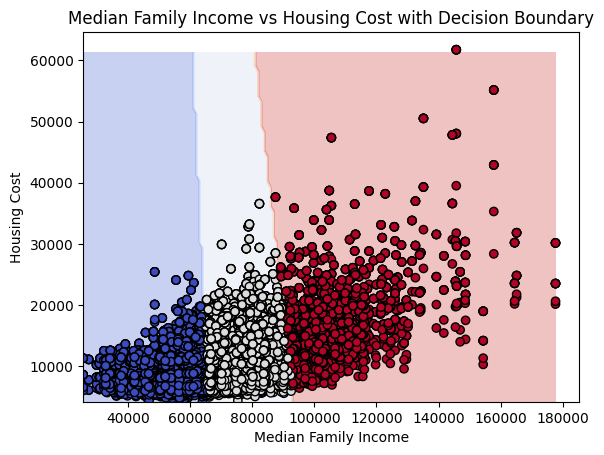

In [45]:
# Assuming median_family_income and housing_cost are already defined
X = np.array(list(zip(median_family_income, housing_cost)))

# Fit the KMeans model
kmeans = KMeans(n_clusters=3)
kmeans.fit(X)

# mesh grid
centroids = kmeans.cluster_centers_
rich_cluster = np.argmax(centroids[:, 0])  # Cluster with higher median_family_income
poor_cluster = 1 - rich_cluster  # The other cluster

# Create a mesh grid
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 1000), np.arange(y_min, y_max, 1000))

# Predict cluster labels for each point in the mesh grid
Z = kmeans.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot the decision boundary
plt.contourf(xx, yy, Z, alpha=0.3, cmap='coolwarm')

# Plot the original data points
labels = np.where(kmeans.labels_ == rich_cluster, 'rich', 'poor')
plt.scatter(median_family_income, housing_cost, c=kmeans.labels_, cmap='coolwarm', edgecolor='k')
for i, label in enumerate(labels):
    kmeans = KMeans(n_clusters=i, random_state=42)

plt.title('Median Family Income vs Housing Cost with Decision Boundary')
plt.xlabel('Median Family Income')
plt.ylabel('Housing Cost')
plt.show()


# Lower class families have average income below $50,000 and housing cost below $15,000

# Decision boundary for middle class families is about $60,000 to $90,000 in income and $10,000 to $20,000 in housing cost

# Upper class families have income above $100,000 and housing cost above $20,000

## K-Means Classifier for Spending

c:\Users\yashk\Dropbox\Rutgers\Rutgers CS\Projects\UnitedStatesStandardOfLiving\my_env\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\yashk\Dropbox\Rutgers\Rutgers CS\Projects\UnitedStatesStandardOfLiving\my_env\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\yashk\Dropbox\Rutgers\Rutgers CS\Projects\UnitedStatesStandardOfLiving\my_env\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_

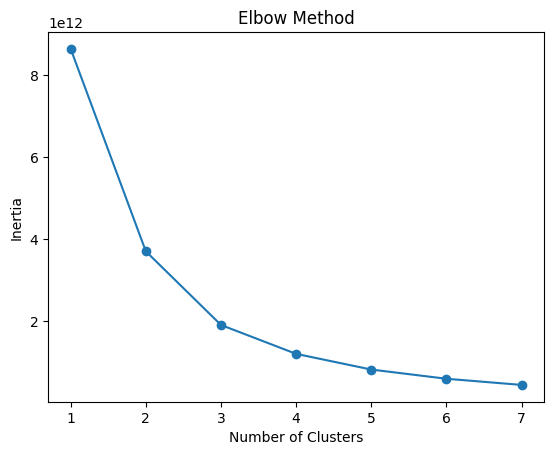

In [46]:
total_cost = cost_of_living_us['total_cost']
cost_of_living_us['savings'] = 1 - (total_cost / cost_of_living_us['median_family_income'])
savings = cost_of_living_us['savings']

savings_income_data = list(zip(median_family_income, savings))
inertias = []

for i in range(1,8):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(savings_income_data)
    inertias.append(kmeans.inertia_)
    
plt.plot(range(1,8), inertias, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.show()

## Ideal Number of Classifiers is K=4

c:\Users\yashk\Dropbox\Rutgers\Rutgers CS\Projects\UnitedStatesStandardOfLiving\my_env\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


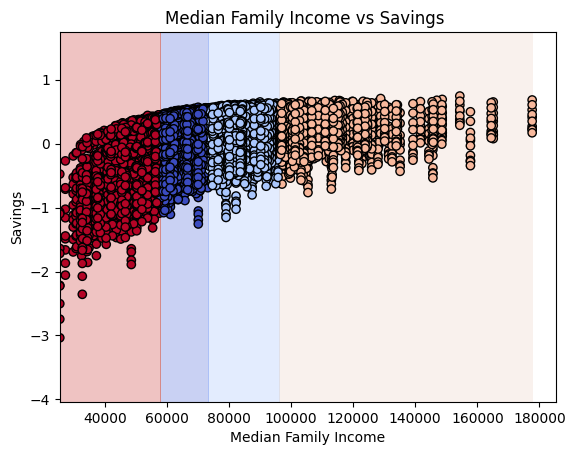

In [47]:
# Assuming median_family_income and housing_cost are already defined
X = np.array(list(zip(median_family_income, savings)))

# Fit the KMeans model
kmeans = KMeans(n_clusters=4)
kmeans.fit(X)

# mesh grid
centroids = kmeans.cluster_centers_

sorted_indices = np.argsort(centroids[:, 1])
labels = ['poor', 'bad', 'good', 'great']
cluster_labels = {sorted_indices[i]: labels[i] for i in range(4)}

# mesh grid
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 100), np.arange(y_min, y_max, 0.01))

# Predict cluster labels for each point in the mesh grid
Z = kmeans.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot the decision boundary
plt.contourf(xx, yy, Z, alpha=0.3, cmap='coolwarm')

plt.scatter(median_family_income, savings, c=kmeans.labels_, cmap='coolwarm', edgecolor='k')

plt.title('Median Family Income vs Savings ')
plt.xlabel('Median Family Income')
plt.ylabel('Savings')
plt.show()

# Poor savings is spending more than 90% of their income, bad savings is spending 80-90%, good savings is spending 70-80%, and great savings is spending less than 70%

## Logistic Regression Tree for isMetro Availability

In [48]:
X = cost_of_living_us.iloc[:, 0:1] + cost_of_living_us.iloc[:, 2:15]
Y = cost_of_living_us.iloc[:, 2:2]

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)



In [49]:
print(X)

      areaname  case_id  childcare_cost county family_member_count  food_cost  \
0          NaN      NaN             NaN    NaN                 NaN        NaN   
1          NaN      NaN             NaN    NaN                 NaN        NaN   
2          NaN      NaN             NaN    NaN                 NaN        NaN   
3          NaN      NaN             NaN    NaN                 NaN        NaN   
4          NaN      NaN             NaN    NaN                 NaN        NaN   
...        ...      ...             ...    ...                 ...        ...   
31425      NaN      NaN             NaN    NaN                 NaN        NaN   
31426      NaN      NaN             NaN    NaN                 NaN        NaN   
31427      NaN      NaN             NaN    NaN                 NaN        NaN   
31428      NaN      NaN             NaN    NaN                 NaN        NaN   
31429      NaN      NaN             NaN    NaN                 NaN        NaN   

       healthcare_cost  hou

## Decision Tree for Logistic Regression

In [50]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.tree import plot_tree

# Prepare the data
X = cost_of_living_us.drop(columns=['isMetro', 'family_member_count'])
y = cost_of_living_us['isMetro']

# convert categorical columns to numeric using one-hot encoding
X = pd.get_dummies(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the DecisionTreeClassifier
clf = DecisionTreeClassifier(random_state=42)

# Fit the model
clf.fit(X_train, y_train)

# Predict on the test set
y_pred = clf.predict(X_test)

# Calculate the accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

Accuracy: 0.98


In [51]:
def tree_visualization(tree, names): # function to visualize the tree
    dot_data = StringIO()
    export_graphviz(tree,out_file=dot_data,
                         feature_names=names,
                         filled=True,rounded=True, 
                         special_characters=True)
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return Image(graph.create_png())

In [52]:
tree_visualization(clf, X.columns)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.8247 to fit



## Test Decision Tree Based on Household Amount, Income, and Cost Factors 

In [118]:
# relevant factors to assess Metro transportation for households
high_importance = list(costs['Cost Type']) + ['num_parents', 'num_children', 'median_family_income']
X_train2 = X_train[high_importance]
X_test2 = X_test[high_importance]

tree2 = DecisionTreeClassifier(criterion='gini', min_samples_split=2, random_state=5).fit(X_train2, y_train)

# Predictions
y_pred2 = tree2.predict(X_test2)

# Accuracy Score
tree_imp_accuracy = accuracy_score(y_test, y_pred2)
print('Decision Tree Accuracy with high importance attributes: {0:.2f}'.format(tree_imp_accuracy))

Decision Tree Accuracy with high importance attributes: 0.85


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.244391 to fit



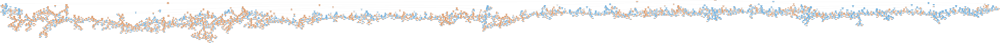

In [119]:
tree_visualization(tree2, high_importance)